In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_csv('./HousePricePrediction - HousePricePrediction.csv')
df = df.drop(['Id'], axis=1)
print(df.shape)

(1460, 80)


In [ ]:
print(df['SalePrice'].describe())

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64


In [ ]:
print(type(df.info()))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [ ]:
# if the feature is catorical and it has unique values more than 1 then  use label encoding
from sklearn.preprocessing import LabelEncoder

def encode_dataset(df):
    le = LabelEncoder()
    for col in df.columns:
        if (len(df[col].unique()) == 1):
            df = df.drop([col], axis=1)
        elif df[col].dtype == 'object':
            df[col] = le.fit_transform(df[col])
    return df

In [ ]:
df_clean = encode_dataset(df)

In [ ]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   int32  
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   int32  
 5   Alley          1460 non-null   int32  
 6   LotShape       1460 non-null   int32  
 7   LandContour    1460 non-null   int32  
 8   Utilities      1460 non-null   int32  
 9   LotConfig      1460 non-null   int32  
 10  LandSlope      1460 non-null   int32  
 11  Neighborhood   1460 non-null   int32  
 12  Condition1     1460 non-null   int32  
 13  Condition2     1460 non-null   int32  
 14  BldgType       1460 non-null   int32  
 15  HouseStyle     1460 non-null   int32  
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [ ]:
null = df_clean.isna().sum()
# print the null serires using for loop
for i in range(len(null)):
    if null.iloc[i] > 0:
        # also print the column name
        print(null.index[i], null.iloc[i])

MasVnrArea 8


In [ ]:
df_clean['LotFrontage'] = df_clean['LotFrontage'].interpolate(method='linear')
df_clean['MnsVnrArea'] = df_clean['MasVnrArea'].interpolate(method='linear')
df_clean['MasVnrArea'] = df_clean['MasVnrArea'].interpolate(method='linear')
df_clean['GarageYrBlt'] = df_clean['GarageYrBlt'].interpolate(method='linear')

In [ ]:
null = df.isna().sum()
# print the null serires using for loop
for i in range(len(null)):
    if null.iloc[i] > 0:
        # also print the column name
        print(null.index[i], null.iloc[i])


Here we interpolated the data for the numerical features which had numerical values missing.

In [ ]:
corr_mat = df.corr()
series = corr_mat['SalePrice'].sort_values(ascending=False)
# give the index for which the value is lesser than 0.3 and greater than -0.3 in an array
index = series[(series < 0.3) & (series > -0.3)].index
print(index)


Index(['HalfBath', 'LotArea', 'CentralAir', 'Electrical', 'PavedDrive',
       'BsmtFullBath', 'RoofStyle', 'BsmtUnfSF', 'SaleCondition',
       'Neighborhood', 'HouseStyle', 'BedroomAbvGr', 'Fence', 'Alley',
       'RoofMatl', 'ExterCond', 'Functional', 'ScreenPorch', 'Exterior2nd',
       'Exterior1st', 'PoolArea', 'Condition1', 'MiscFeature', 'LandSlope',
       'MoSold', '3SsnPorch', 'Street', 'GarageCond', 'LandContour',
       'BsmtCond', 'BsmtFinType2', 'Condition2', 'GarageQual', 'BsmtFinSF2',
       'Utilities', 'BsmtHalfBath', 'MiscVal', 'LowQualFinSF', 'YrSold',
       'SaleType', 'LotConfig', 'OverallCond', 'MSSubClass', 'BldgType',
       'Heating', 'BsmtFinType1', 'PoolQC', 'EnclosedPorch', 'KitchenAbvGr',
       'MSZoning', 'LotShape', 'MasVnrType'],
      dtype='object')


In [ ]:
df_clean = df_clean.drop(index, axis=1)


<Axes: >

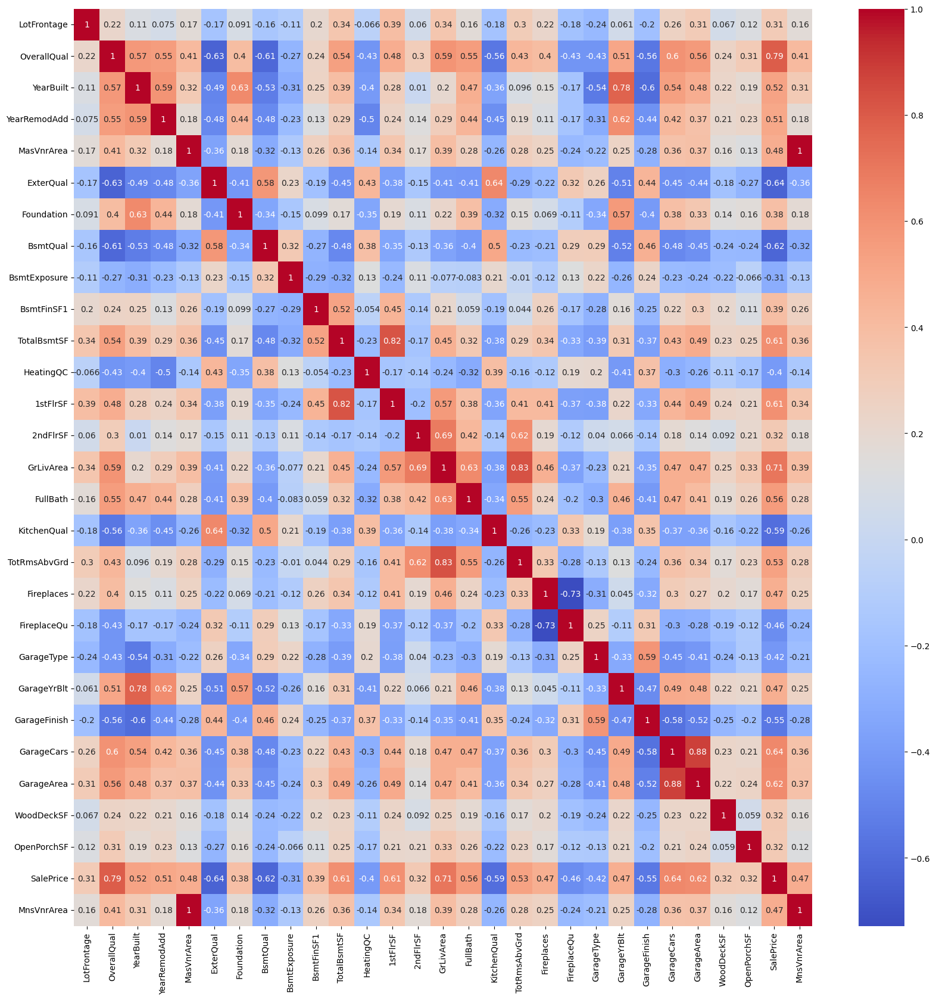

In [ ]:
plt.figure(figsize=(20, 20))
sns.heatmap(df_clean.corr(), annot=True, cmap='coolwarm')

In [ ]:
# split the data into train and test
from sklearn.model_selection import train_test_split

X = df_clean.drop(['SalePrice'], axis=1)
y = df_clean['SalePrice']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# implement the linear regression
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)

from sklearn.metrics import mean_absolute_error, r2_score

# print('MSE', mean_absolute_percentage_error(y_test, y_pred))
print('MAE', mean_absolute_error(y_test, y_pred))
print('R2', r2_score(y_test, y_pred))

MAE 22793.52230544375
R2 0.8350845556507822


In [ ]:
def relative_mae(actual_values, predicted_values):
    n = len(actual_values)
    rmae = sum(abs(actual - predicted) / abs(actual) for actual, predicted in zip(actual_values, predicted_values)) / n
    return rmae

In [ ]:
print('RMAE', relative_mae(y_test, y_pred) * df.shape[0])

RMAE 203.60742541387776


In [ ]:
sns.pairplot(df)

In [ ]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000
